<p>
<img src="http://www.cerm.unifi.it/chianti/images/logo%20unifi_positivo.jpg" 
        alt="UniFI logo" style="float: left; width: 20%; height: 20%;">
<div align="right">
Massimo Nocentini<br>
<small>
<br>January 21, 2016: initial attempts
</small>
</div>
</p>
<br>
<br>
<div align="center">
<b>Abstract</b><br>
Drawing graphs from modular Riordan arrays.
</div>

In [63]:
from sympy import *
from sympy.abc import n, i, N, x, lamda, phi, z, j, r, k, a, t, alpha

from collections import defaultdict
from IPython.display import Image

import networkx as nx

init_printing()

In [2]:
%run ../../src/matrix_functions.py

In [92]:
%pylab inline
pylab.rcParams['figure.figsize']=(20,20)

Populating the interactive namespace from numpy and matplotlib


In [131]:
dim=2**7
d = IndexedBase('d')

In [132]:
P = Matrix(dim, dim, riordan_matrix_by_recurrence(dim, lambda n, k: {(n-1, k-1):1, (n-1, k):1},  init={(0,0):1}),)
#P

In [134]:
C = Matrix(dim, dim, riordan_matrix_by_recurrence(dim, lambda n, k: {(n-1, k-1+i):1 for i in range(dim)},  
                                                  init={(0,0):1},),)
#C

In [157]:
Cn = Matrix(dim, dim, riordan_matrix_by_recurrence(dim, lambda n, k: {(n-1, k-1+i):i+1 for i in range(dim)},  
                                                  init={(0,0):1},),)
#Cn

In [135]:
M = Matrix(dim, dim, riordan_matrix_by_recurrence(dim, lambda n, k: {(n-1, k-1):1, (n-1, k):1, (n-1, k+1):1},  init={(0,0):1}),)
#M

In [136]:
B = Matrix(dim, dim, riordan_matrix_by_recurrence(dim, lambda n, k: {(n-1, k-1):1, (n-1, k):2, (n-1, k+1):1},  init={(0,0):1}),)
#B

In [151]:
def draw_graph(M, modulo=2, ctor=lambda nx: nx.Graph(), post=lambda c: c):
    G = ctor(nx)
    for i in range(M.rows):
        for j in range(i+1):
            if post(M[i, j] % modulo):
                G.add_edge(i, j)
    return G

In [166]:

def draw_nx_graph(G, nodes_colors={}, filename=None, nodes_labels={}, layout=lambda l: l.shell_layout):
    
    import matplotlib.pyplot as plt

    if 'draw' not in nodes_labels: nodes_labels['draw'] = True
    
    nc = defaultdict(lambda: 'gray')
    nc.update(nodes_colors)
    
    l = layout(nx.layout)
    pos = l(G)#, iterations=200) # positions for all nodes

    degrees = G.in_degree() if G.is_directed() else G.degree()
    for seq_id in G.nodes():
        nx.draw_networkx_nodes(G, pos, nodelist=[seq_id], 
                               node_color=nc[seq_id],
                               node_size=degrees[seq_id]*10, 
                               alpha=0.8)

    """
    nx.draw_networkx_nodes(G,pos,
                           nodelist=set(G.nodes())-set(favorite_nodes.keys()),
                           node_color='r',
                           node_size=500,
                       alpha=0.8)
    """
    
    nx.draw_networkx_edges(G,pos,width=1.0,alpha=0.5)
    
    if nodes_labels['draw']:
        ls = {n:nodes_labels[n] if n in nodes_labels else ''#str(n) 
              for n in G.nodes()}
        nx.draw_networkx_labels(G,pos,ls,font_size=16)

    plt.axis('off')
    if filename: plt.savefig(filename, dpi=600) # save as png
    else: plt.show()


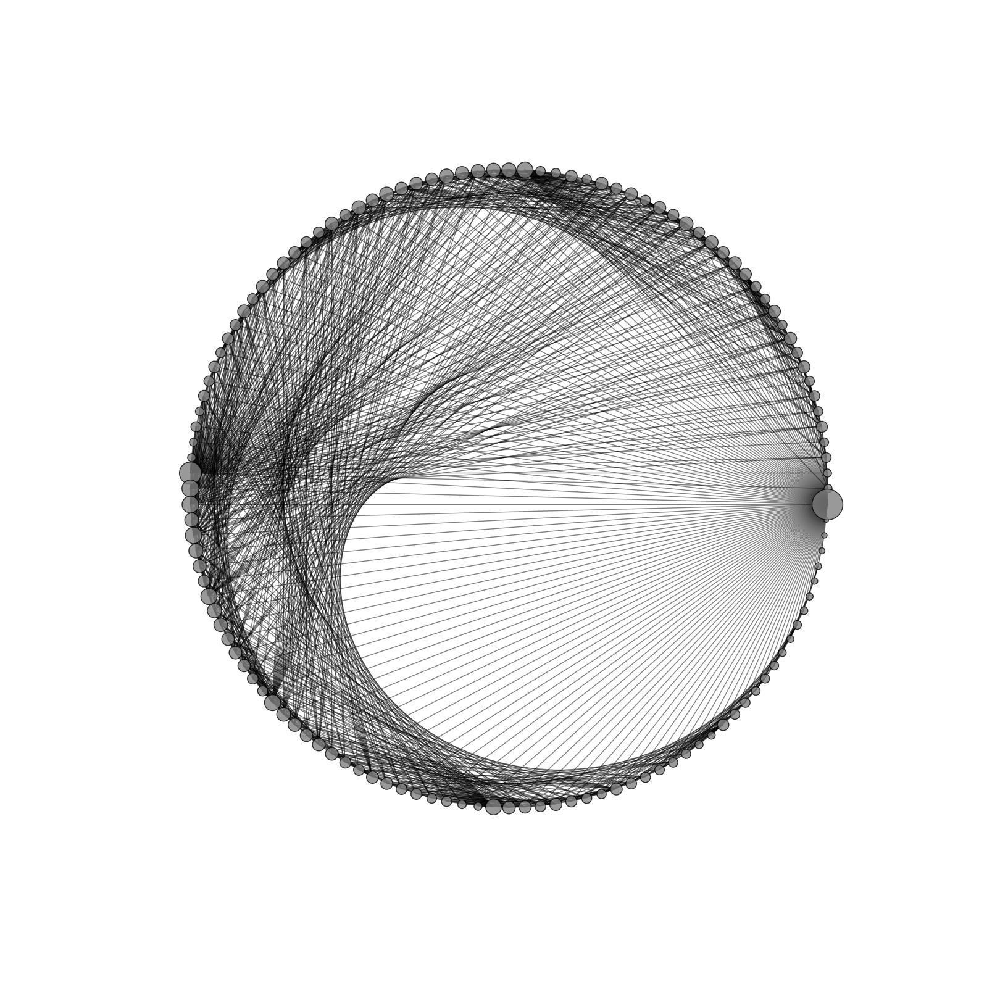

In [169]:
G = draw_graph(C)

draw_nx_graph(G, filename='catalan.svg')


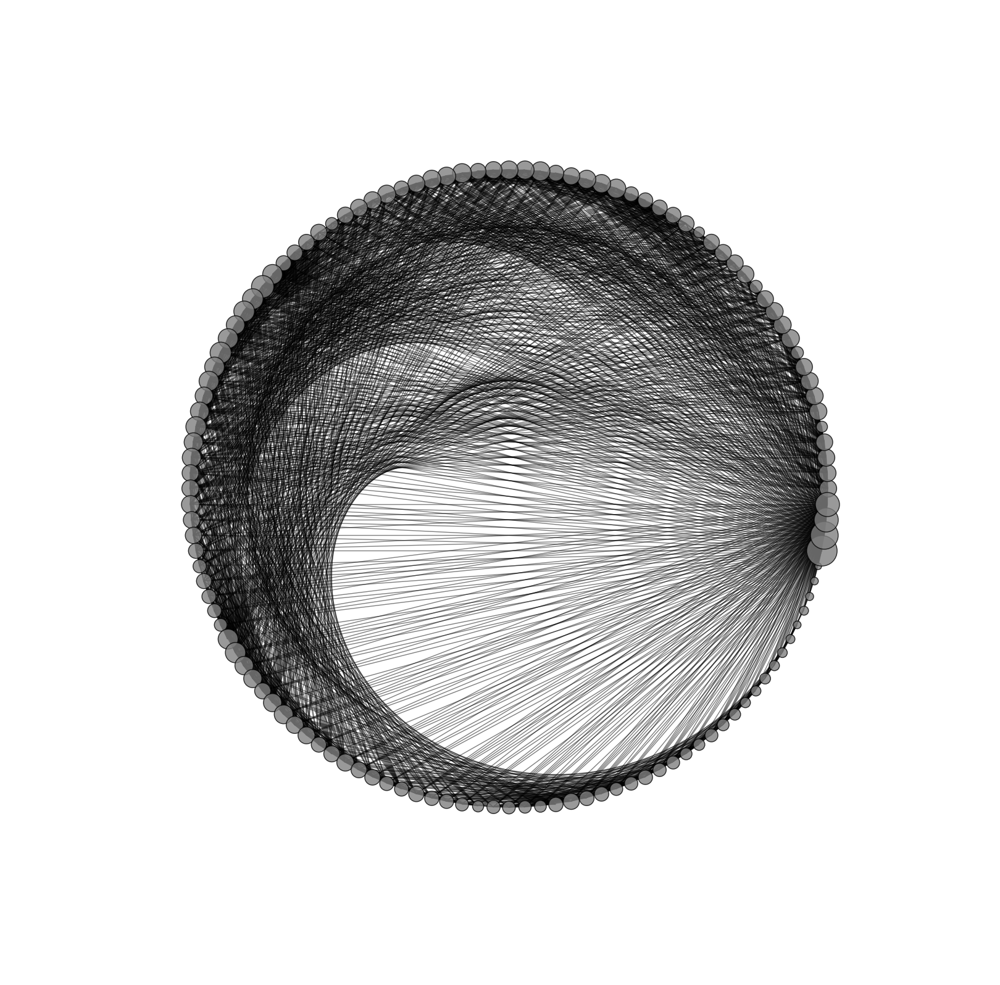

In [170]:
G = draw_graph(C, modulo=5, post=lambda c: bool(c))

draw_nx_graph(G, filename='catalan-mod5.svg')


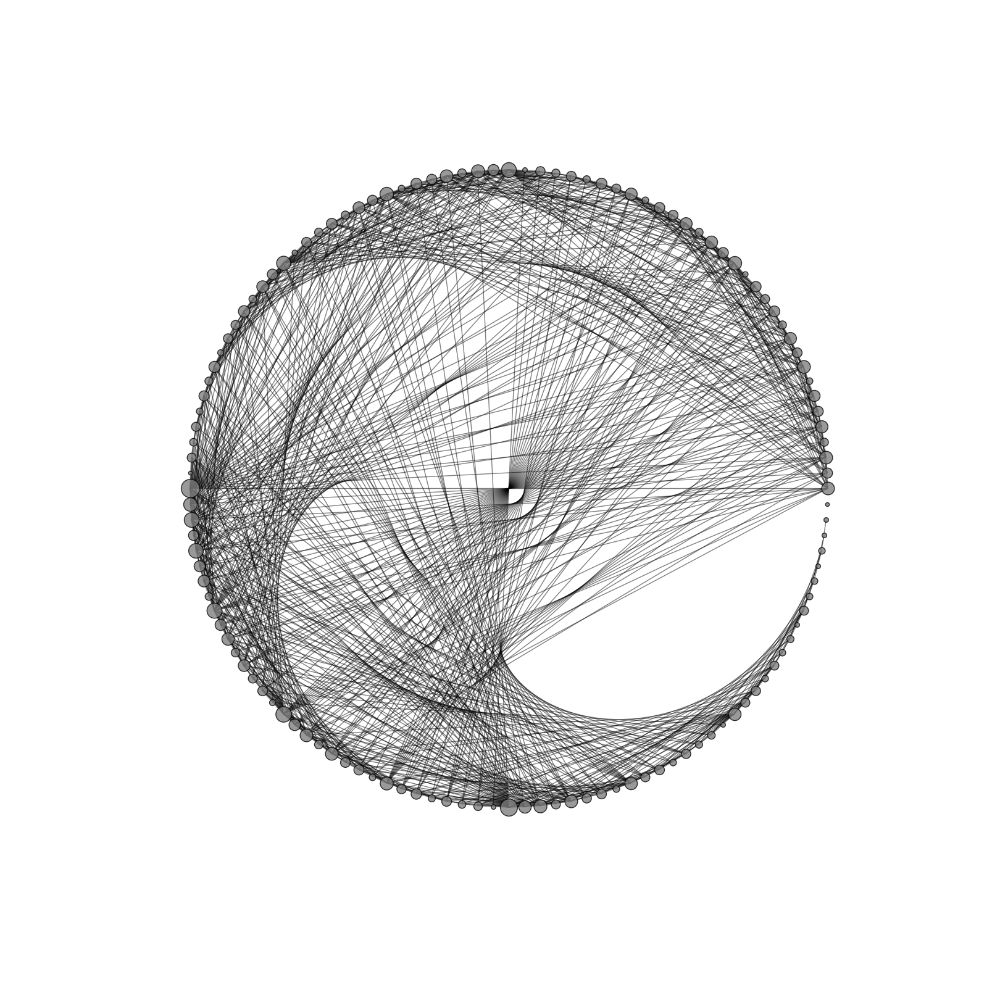

In [171]:
G = draw_graph(Cn)

draw_nx_graph(G, filename='catalan-weighted.svg')


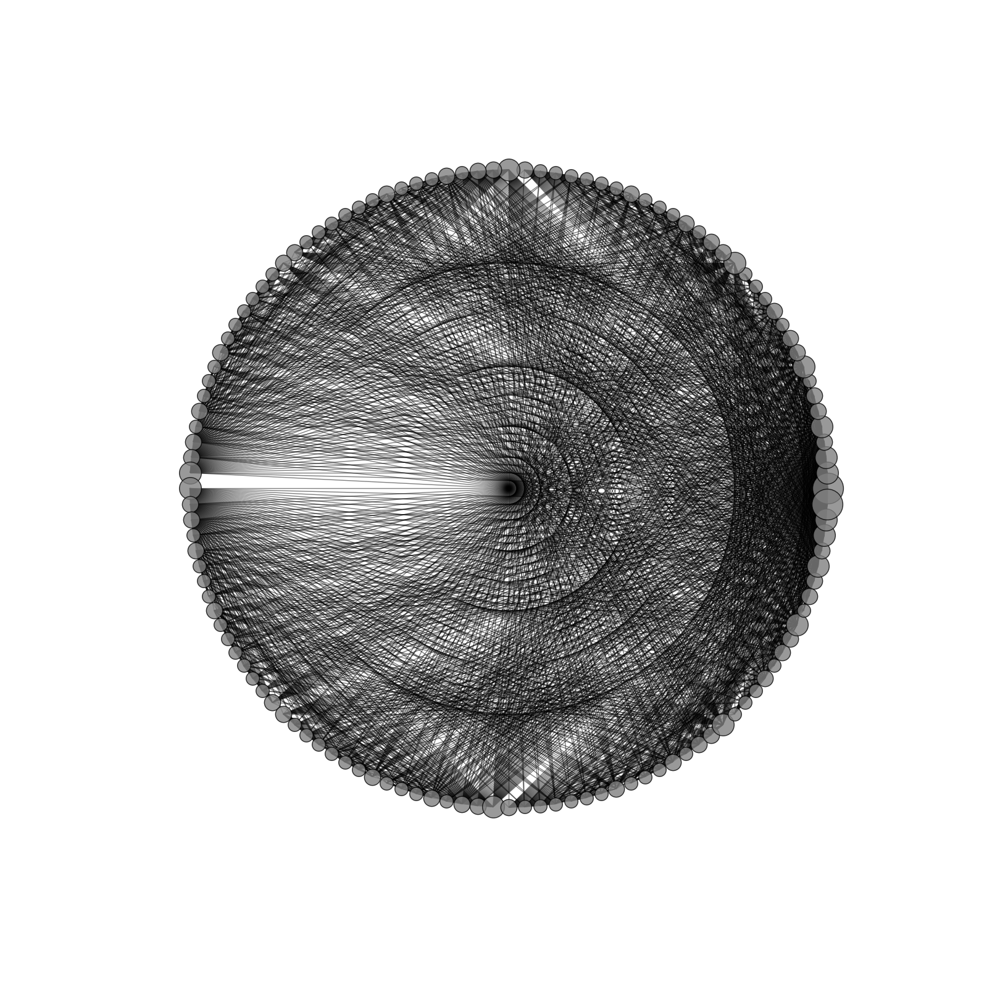

In [172]:
G = draw_graph(P)

draw_nx_graph(G, filename='pascal.svg')


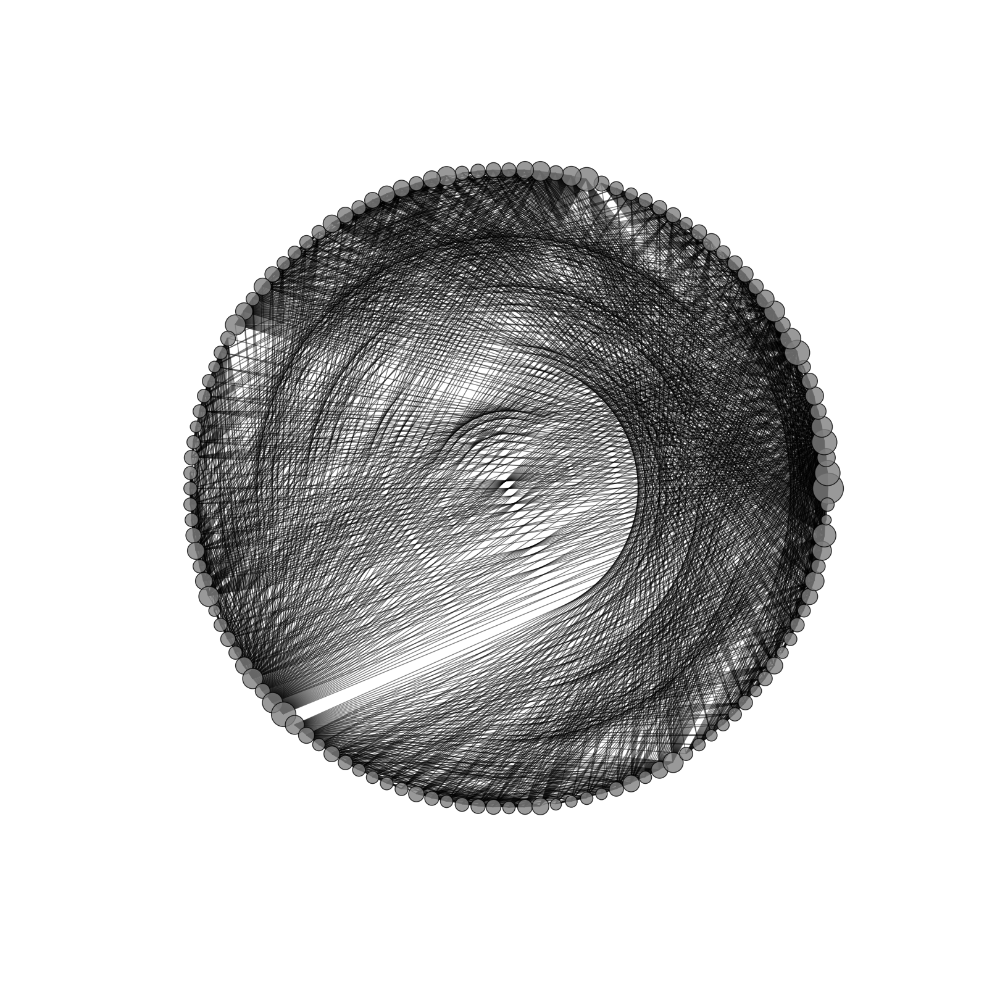

In [179]:
G = draw_graph(P, modulo=3, post=lambda c: bool(c))

draw_nx_graph(G, filename='pascal-mod3.svg')


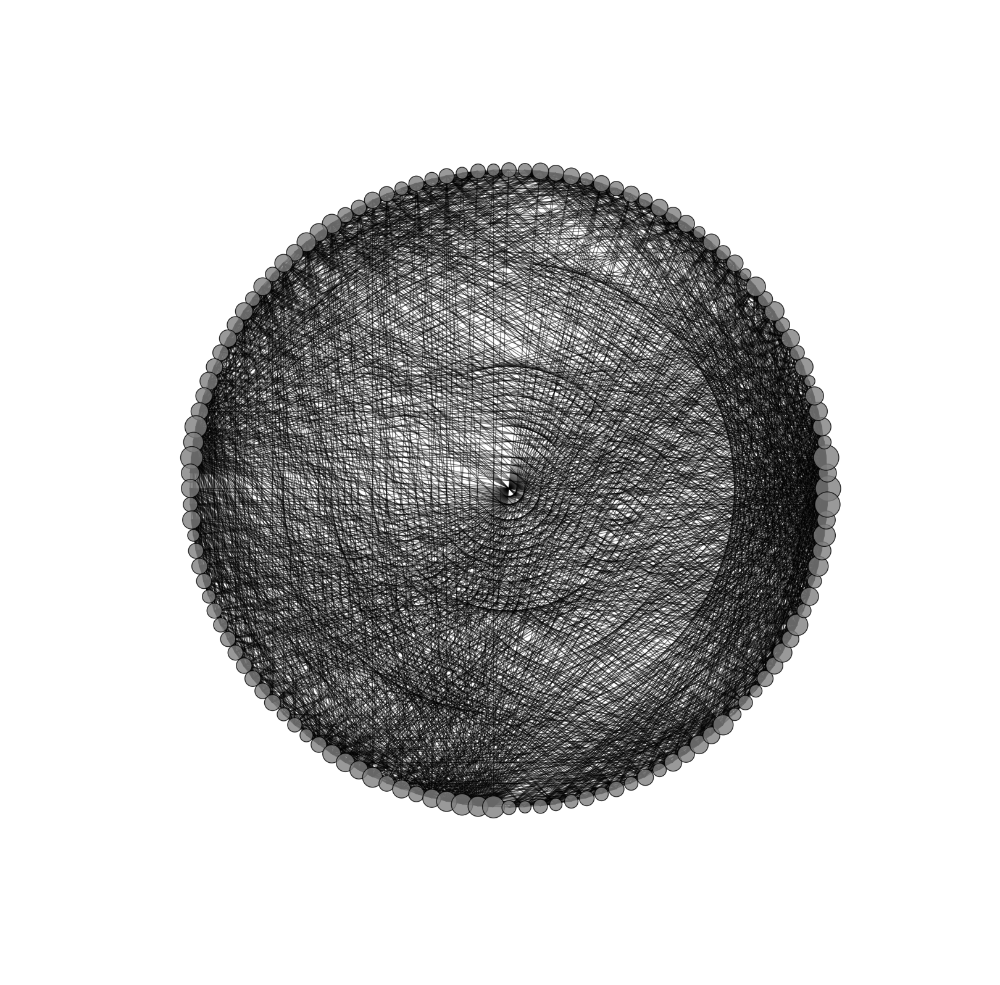

In [180]:
G = draw_graph(M)

draw_nx_graph(G, filename='motzkin.svg')


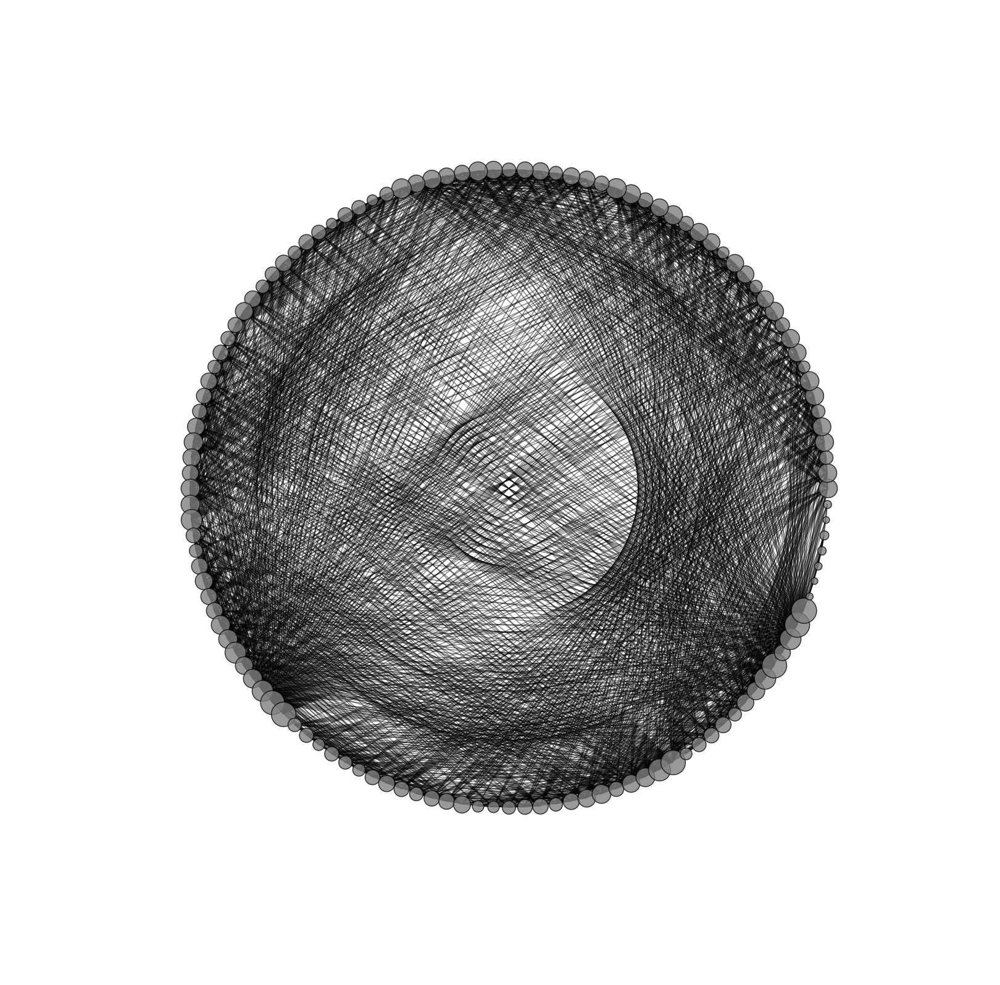

In [183]:
G = draw_graph(M, modulo=3, post=bool)

draw_nx_graph(G, filename='motzkin-mod3.svg')


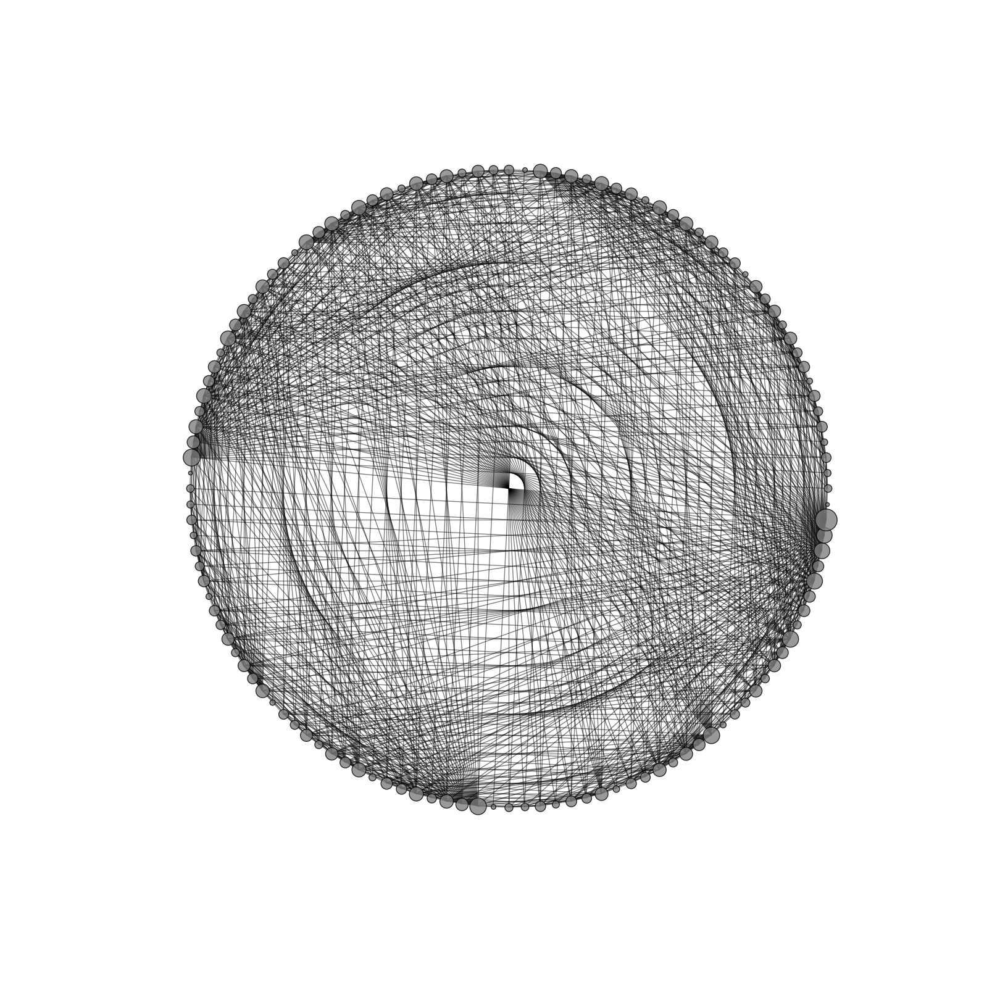

In [184]:
G = draw_graph(B)

draw_nx_graph(G, filename='shapiro.svg')


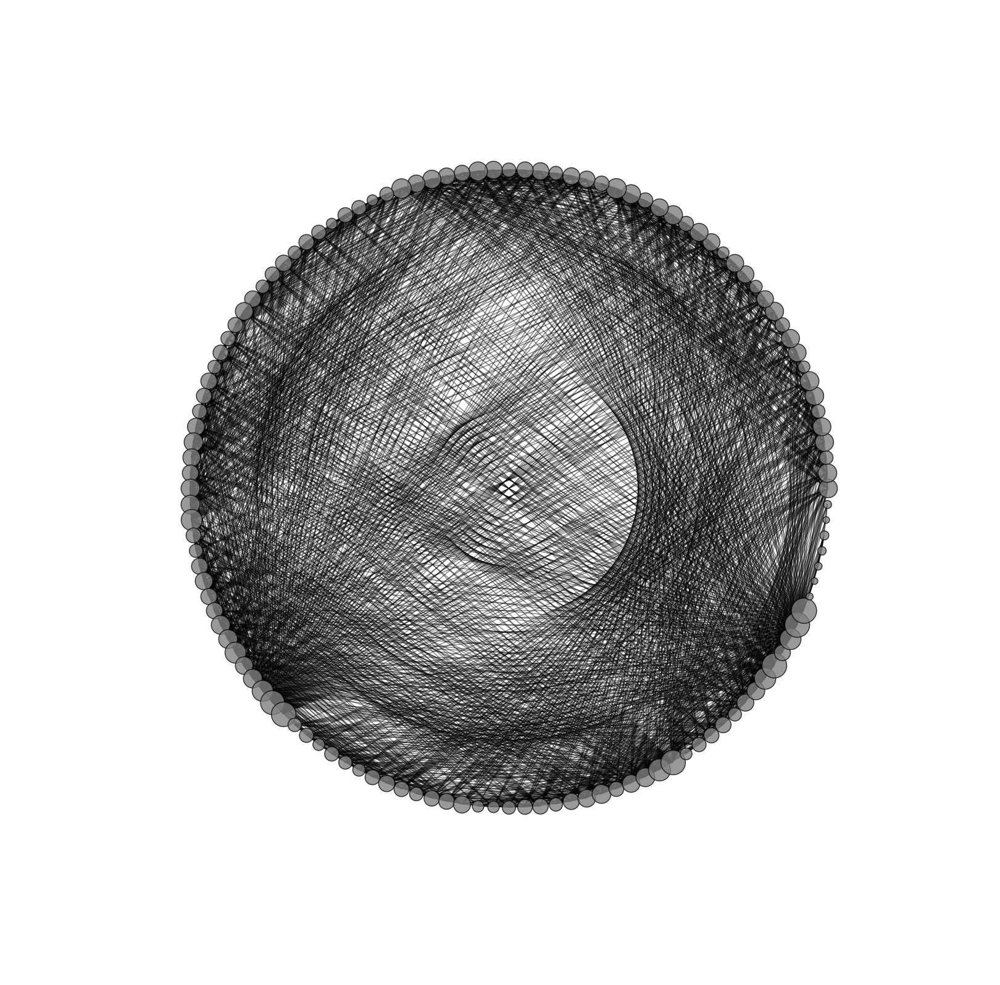

In [185]:
G = draw_graph(B, modulo=3, post=bool)

draw_nx_graph(G, filename='shapiro-mod3.svg')


---
<a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/"><img alt="Creative Commons License" style="border-width:0" src="https://i.creativecommons.org/l/by-nc-sa/4.0/88x31.png" /></a><br />This work is licensed under a <a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/">Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International License</a>.